In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
print(os.listdir("../input"))


FileNotFoundError: [WinError 3] The system cannot find the path specified: '../input'

In [17]:
% matplotlib inline
import h5py
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from keras.utils.io_utils import HDF5Matrix


In [18]:
import keras
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D, MaxPool2D, Flatten, Dense, Dropout, Activation, Input
from keras.optimizers import SGD
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, LabelBinarizer

In [19]:
from keras.applications import ResNet50
from keras.applications import InceptionV3
from keras.applications import Xception # TensorFlow ONLY
from keras.applications import VGG16, VGG19, InceptionV3
from keras.applications import imagenet_utils
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping 
import warnings
warnings.filterwarnings('ignore')

In [20]:
models_filename = '../input/v8-vgg16-model-1/v8_vgg16_model_1.h5'
image_dir = '../input/food-101/food-101/food-101/images'


In [21]:
image_size = (224, 224)
batch_size = 16
epochs = 80

In [22]:
# 5gb of images won't fit in my memory. use datagenerator to go across all images.
train_datagen = ImageDataGenerator(
rescale = 1./255,
horizontal_flip = False,
fill_mode = "nearest",
zoom_range = 0,
width_shift_range = 0,
height_shift_range=0,
rotation_range=0)


In [23]:

train_generator = train_datagen.flow_from_directory(
image_dir,
target_size = (image_size[0], image_size[1]),
batch_size = batch_size, 
class_mode = "categorical")

Found 101000 images belonging to 101 classes.


In [24]:
model = VGG16(weights=None, include_top=False, input_shape=(image_size[0], image_size[1], 3))


In [26]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [27]:
#Adding custom Layers 
x = model.output
x = Flatten()(x)
x = Dense(101*2, activation="relu")(x)
x = Dense(101*2, activation="relu")(x)
predictions = Dense(101, activation="softmax")(x)
model_final = Model(input=model.input, output=predictions)
model_final.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])
model_final.load_weights(models_filename)

In [28]:
model_final.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [29]:
preds = model_final.evaluate_generator(train_generator, steps=800, workers=8, use_multiprocessing=True)

In [30]:
preds

[1.3511833934485913, 0.78070312500000005]

In [41]:
print('Accuracy: %.3f' % preds[1])

Accuracy: 0.781


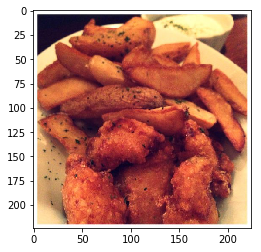

correct answer is:  fish_and_chips

CNN thinks its: chicken_wings


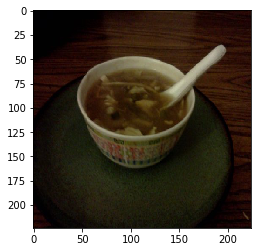

correct answer is:  hot_and_sour_soup

CNN thinks its: hot_and_sour_soup


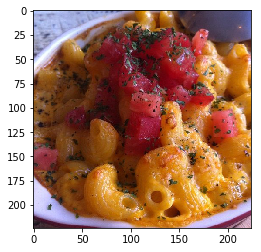

correct answer is:  macaroni_and_cheese

CNN thinks its: macaroni_and_cheese


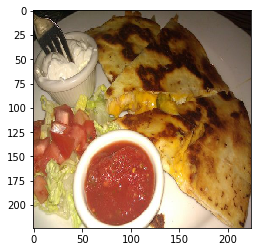

correct answer is:  chicken_quesadilla

CNN thinks its: chicken_quesadilla


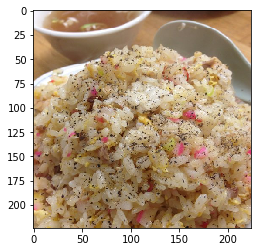

correct answer is:  fried_rice

CNN thinks its: fried_rice


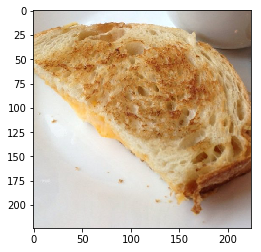

correct answer is:  grilled_cheese_sandwich

CNN thinks its: grilled_cheese_sandwich


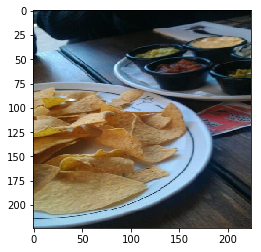

correct answer is:  nachos

CNN thinks its: ceviche


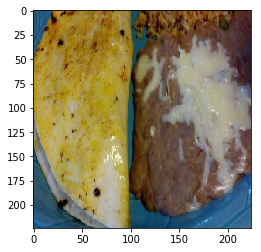

correct answer is:  chicken_quesadilla

CNN thinks its: garlic_bread


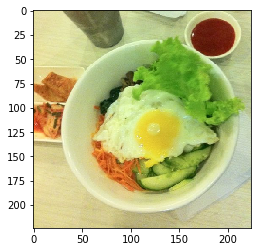

correct answer is:  bibimbap

CNN thinks its: bibimbap


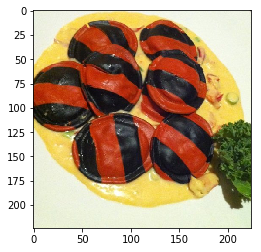

correct answer is:  ravioli

CNN thinks its: ravioli


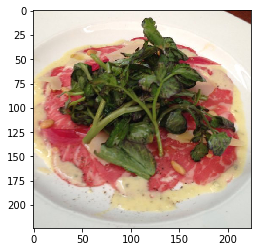

correct answer is:  beef_carpaccio

CNN thinks its: beef_carpaccio


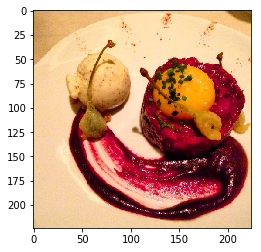

correct answer is:  beef_tartare

CNN thinks its: beet_salad


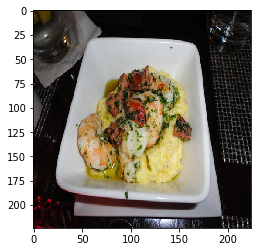

correct answer is:  shrimp_and_grits

CNN thinks its: risotto


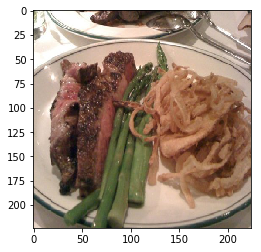

correct answer is:  steak

CNN thinks its: steak


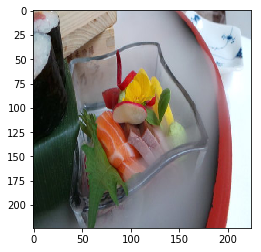

correct answer is:  sashimi

CNN thinks its: sashimi


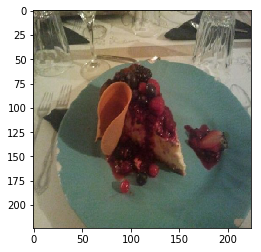

correct answer is:  cheesecake

CNN thinks its: cheesecake


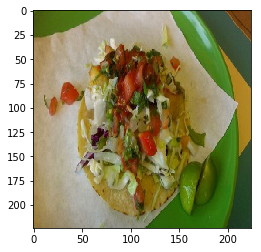

correct answer is:  tacos

CNN thinks its: tacos


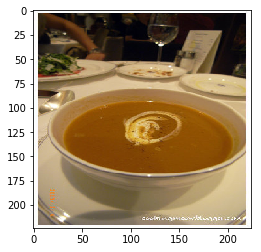

correct answer is:  lobster_bisque

CNN thinks its: lobster_bisque


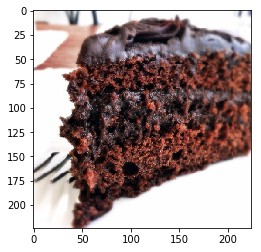

correct answer is:  chocolate_cake

CNN thinks its: chocolate_cake


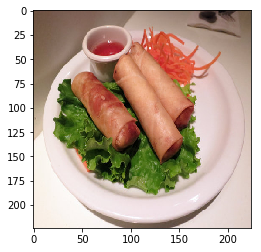

correct answer is:  spring_rolls

CNN thinks its: spring_rolls


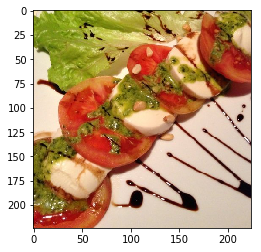

correct answer is:  caprese_salad

CNN thinks its: caprese_salad


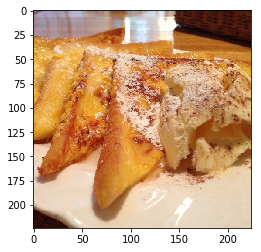

correct answer is:  french_toast

CNN thinks its: french_toast


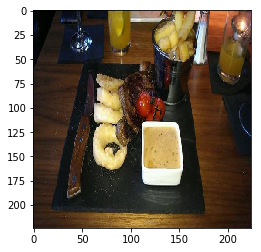

correct answer is:  steak

CNN thinks its: foie_gras


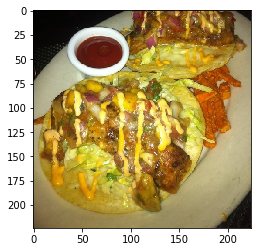

correct answer is:  tacos

CNN thinks its: ceviche


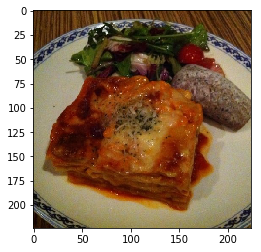

correct answer is:  lasagna

CNN thinks its: lasagna


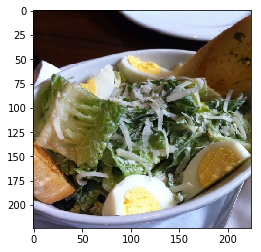

correct answer is:  caesar_salad

CNN thinks its: ravioli


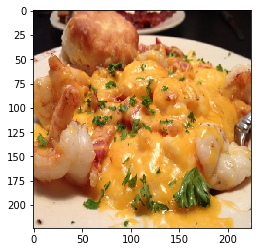

correct answer is:  shrimp_and_grits

CNN thinks its: ravioli


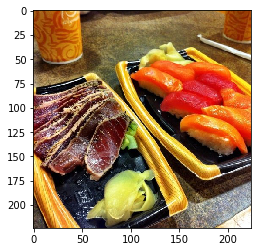

correct answer is:  sushi

CNN thinks its: sushi


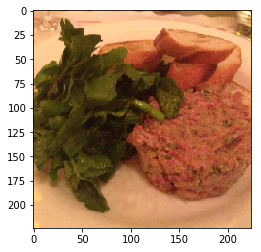

correct answer is:  beef_tartare

CNN thinks its: beef_tartare


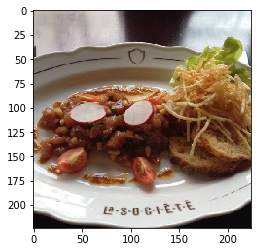

correct answer is:  tuna_tartare

CNN thinks its: tuna_tartare


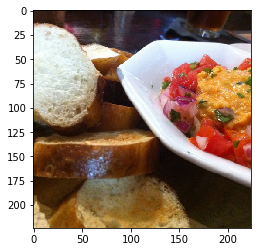

correct answer is:  hummus

CNN thinks its: hummus


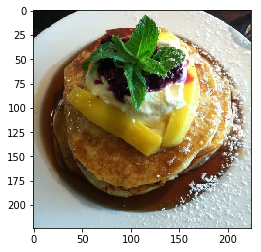

correct answer is:  pancakes

CNN thinks its: pancakes


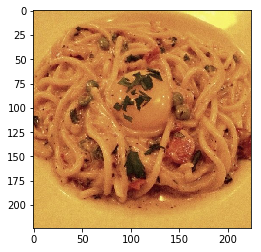

correct answer is:  spaghetti_carbonara

CNN thinks its: spaghetti_carbonara


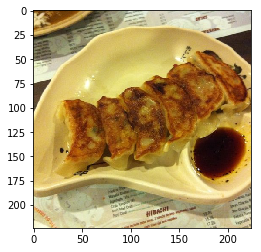

correct answer is:  gyoza

CNN thinks its: gyoza


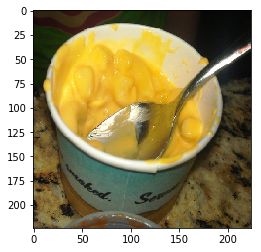

correct answer is:  macaroni_and_cheese

CNN thinks its: macaroni_and_cheese


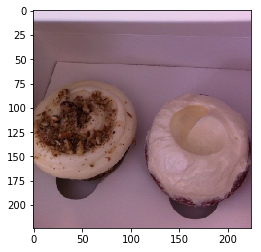

correct answer is:  cup_cakes

CNN thinks its: cup_cakes


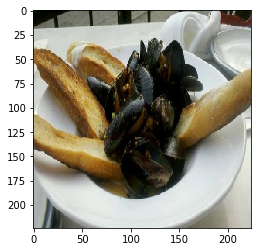

correct answer is:  mussels

CNN thinks its: mussels


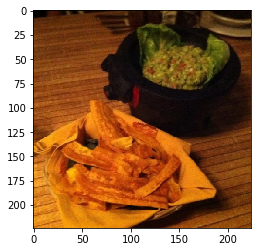

correct answer is:  guacamole

CNN thinks its: guacamole


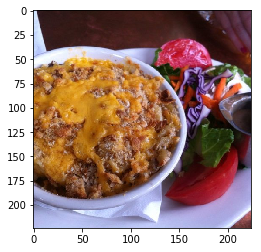

correct answer is:  macaroni_and_cheese

CNN thinks its: macaroni_and_cheese


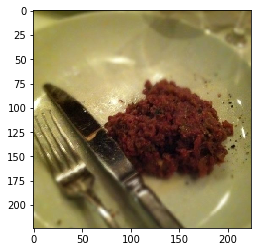

correct answer is:  beef_tartare

CNN thinks its: beef_tartare


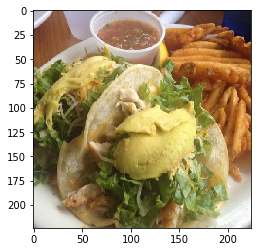

correct answer is:  tacos

CNN thinks its: omelette


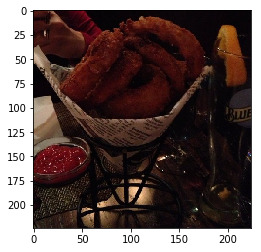

correct answer is:  onion_rings

CNN thinks its: churros


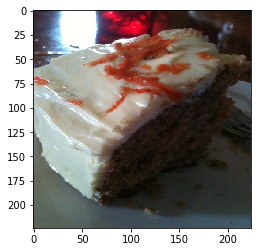

correct answer is:  carrot_cake

CNN thinks its: carrot_cake


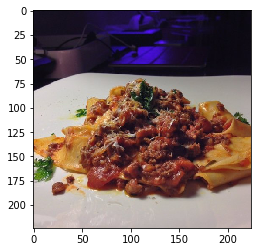

correct answer is:  spaghetti_bolognese

CNN thinks its: ravioli


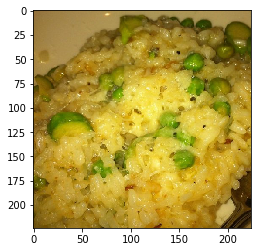

correct answer is:  risotto

CNN thinks its: risotto


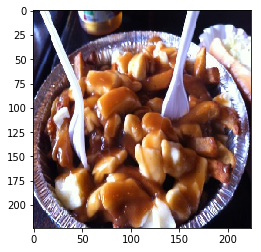

correct answer is:  poutine

CNN thinks its: poutine


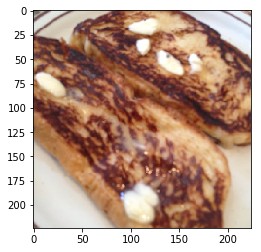

correct answer is:  french_toast

CNN thinks its: pancakes


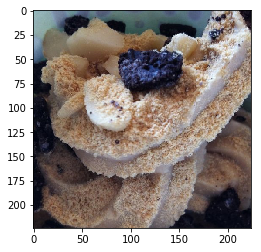

correct answer is:  frozen_yogurt

CNN thinks its: frozen_yogurt


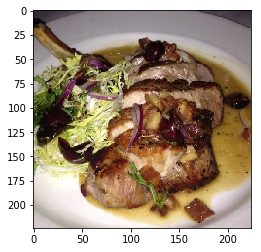

correct answer is:  pork_chop

CNN thinks its: filet_mignon


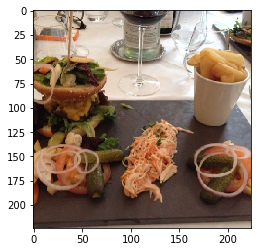

correct answer is:  hamburger

CNN thinks its: ceviche


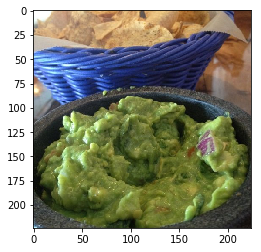

correct answer is:  guacamole

CNN thinks its: guacamole


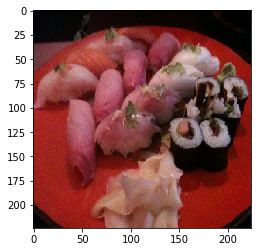

correct answer is:  sushi

CNN thinks its: sushi


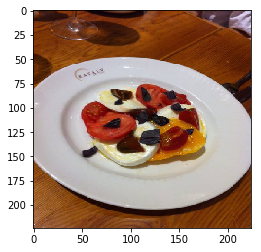

correct answer is:  caprese_salad

CNN thinks its: panna_cotta


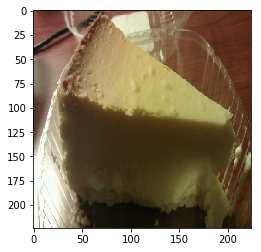

correct answer is:  cheesecake

CNN thinks its: cheesecake


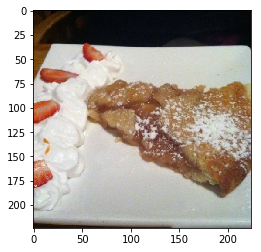

correct answer is:  apple_pie

CNN thinks its: apple_pie


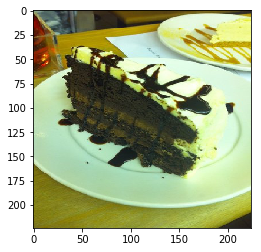

correct answer is:  chocolate_cake

CNN thinks its: chocolate_cake


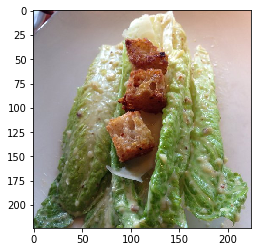

correct answer is:  caesar_salad

CNN thinks its: caesar_salad


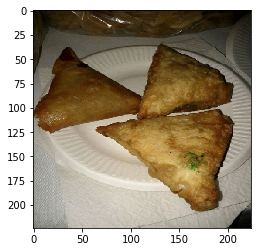

correct answer is:  samosa

CNN thinks its: samosa


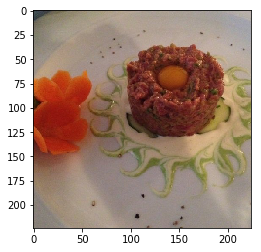

correct answer is:  beef_tartare

CNN thinks its: beef_tartare


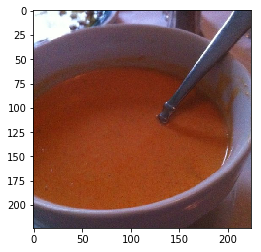

correct answer is:  lobster_bisque

CNN thinks its: lobster_bisque


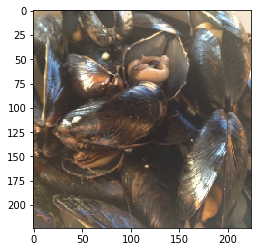

correct answer is:  mussels

CNN thinks its: mussels


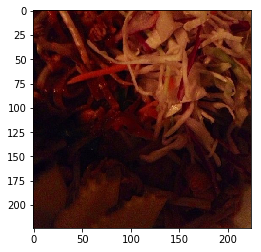

correct answer is:  pad_thai

CNN thinks its: ceviche


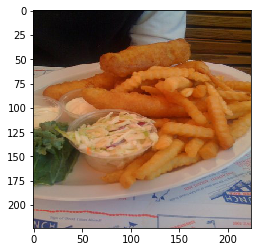

correct answer is:  fish_and_chips

CNN thinks its: crab_cakes


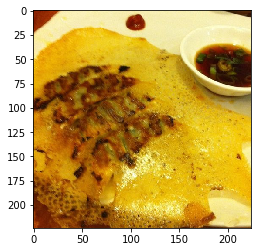

correct answer is:  gyoza

CNN thinks its: gyoza


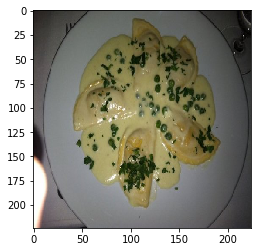

correct answer is:  ravioli

CNN thinks its: ravioli


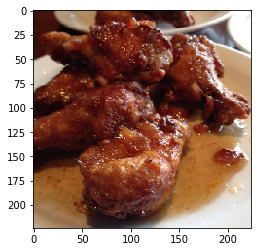

correct answer is:  chicken_wings

CNN thinks its: chicken_wings


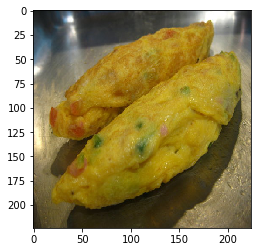

correct answer is:  omelette

CNN thinks its: omelette


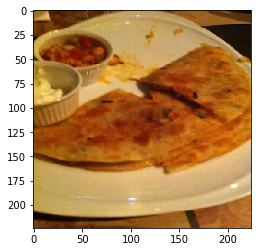

correct answer is:  chicken_quesadilla

CNN thinks its: chicken_quesadilla


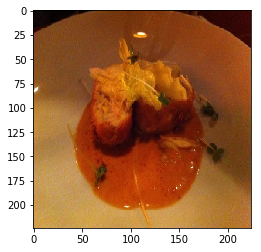

correct answer is:  crab_cakes

CNN thinks its: crab_cakes


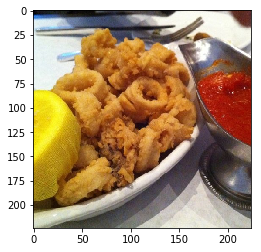

correct answer is:  fried_calamari

CNN thinks its: fried_calamari


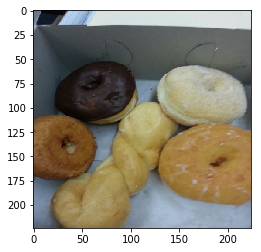

correct answer is:  donuts

CNN thinks its: donuts


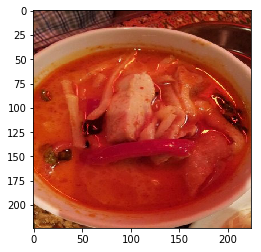

correct answer is:  chicken_curry

CNN thinks its: chicken_curry


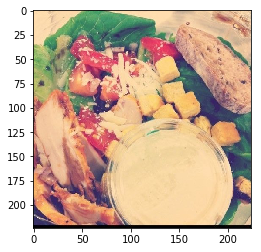

correct answer is:  caesar_salad

CNN thinks its: hummus


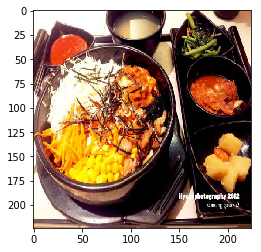

correct answer is:  bibimbap

CNN thinks its: bibimbap


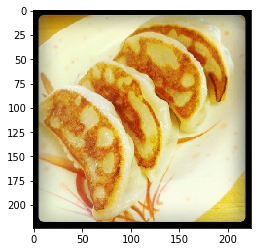

correct answer is:  gyoza

CNN thinks its: gyoza


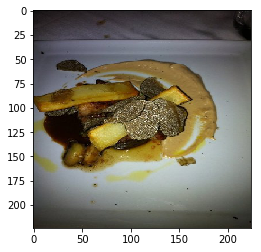

correct answer is:  filet_mignon

CNN thinks its: foie_gras


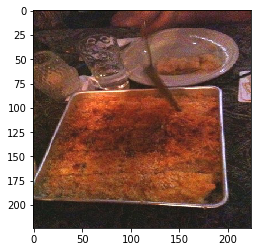

correct answer is:  macaroni_and_cheese

CNN thinks its: macaroni_and_cheese


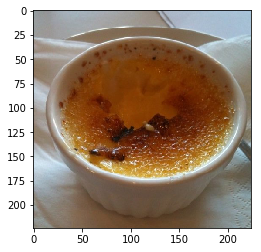

correct answer is:  creme_brulee

CNN thinks its: creme_brulee


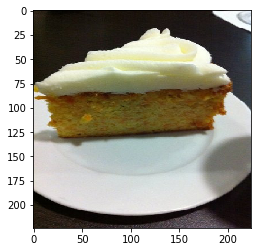

correct answer is:  carrot_cake

CNN thinks its: carrot_cake


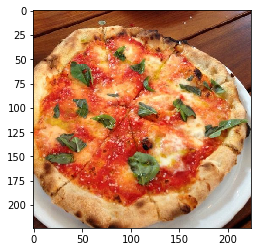

correct answer is:  pizza

CNN thinks its: pizza


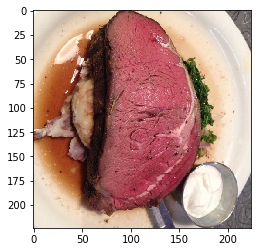

correct answer is:  prime_rib

CNN thinks its: prime_rib


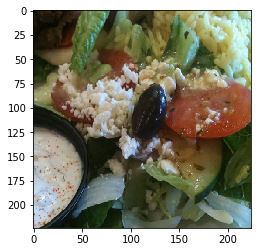

correct answer is:  greek_salad

CNN thinks its: greek_salad


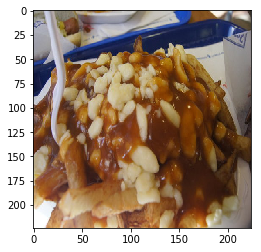

correct answer is:  poutine

CNN thinks its: poutine


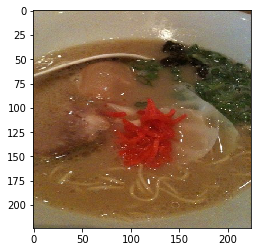

correct answer is:  ramen

CNN thinks its: ramen


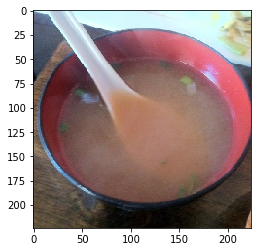

correct answer is:  miso_soup

CNN thinks its: miso_soup


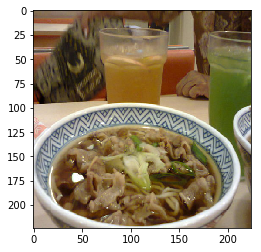

correct answer is:  ramen

CNN thinks its: pho


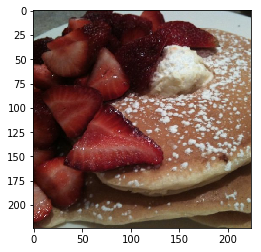

correct answer is:  pancakes

CNN thinks its: pancakes


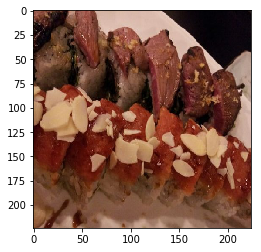

correct answer is:  sushi

CNN thinks its: sushi


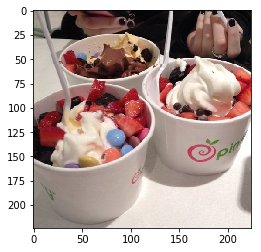

correct answer is:  frozen_yogurt

CNN thinks its: frozen_yogurt


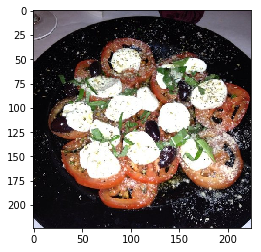

correct answer is:  caprese_salad

CNN thinks its: caprese_salad


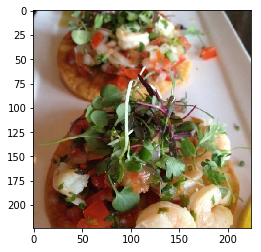

correct answer is:  ceviche

CNN thinks its: ceviche


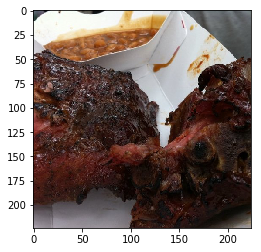

correct answer is:  baby_back_ribs

CNN thinks its: baby_back_ribs


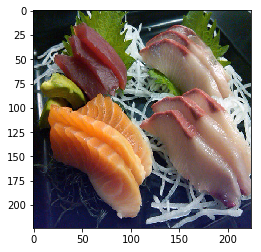

correct answer is:  sashimi

CNN thinks its: sashimi


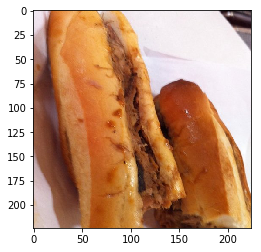

correct answer is:  pulled_pork_sandwich

CNN thinks its: hot_dog


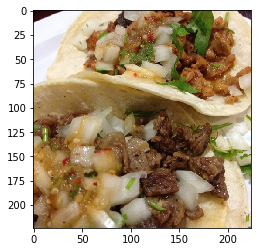

correct answer is:  tacos

CNN thinks its: tacos


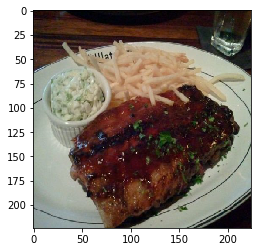

correct answer is:  baby_back_ribs

CNN thinks its: baby_back_ribs


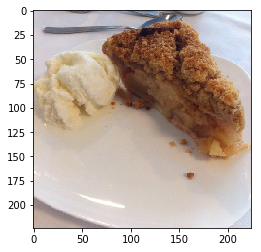

correct answer is:  apple_pie

CNN thinks its: apple_pie


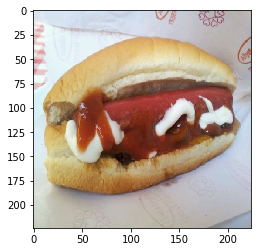

correct answer is:  hot_dog

CNN thinks its: hot_dog


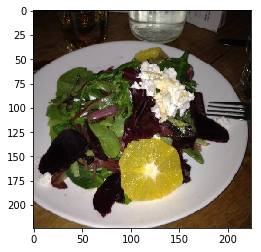

correct answer is:  beet_salad

CNN thinks its: beet_salad


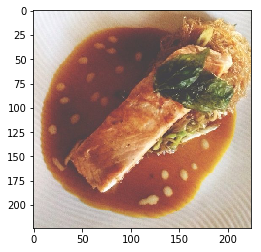

correct answer is:  grilled_salmon

CNN thinks its: breakfast_burrito


In [31]:
# routine for human evaluation - use the generator so we can see how well it can predict
for n in range(100):
    _ = train_generator.next()
    image, classifier = (_[0][0],_[1][0]) # take the first image from the batch
    index = np.argmax(classifier)
    answer = list(train_generator.class_indices.keys())[index]
    predicted = model_final.predict(np.asarray([image]))
    predicted_answer_index = np.argmax(predicted[0])
    predicted_answer = list(train_generator.class_indices.keys())[predicted_answer_index]

    plt.imshow(image)
    plt.show()

    print('correct answer is: ', answer)
    print()
    print('CNN thinks it''s:', predicted_answer)

In [32]:
model_final.save_weights('Food_Class_Model.h5')